<a href="https://colab.research.google.com/github/NataSamo/Python-ML/blob/main/CNN_Flowers.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import os
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Model
import matplotlib.pyplot as plt

In [ ]:
!kaggle datasets download -d alxmamaev/flowers-recognition


!unzip flowers-recognition.zip


data_dir = 'flowers'


img_width, img_height = 150, 150
batch_size = 32

Dataset URL: https://www.kaggle.com/datasets/alxmamaev/flowers-recognition
License(s): unknown
100% 224M/225M [00:01<00:00, 124MB/s]
100% 225M/225M [00:01<00:00, 124MB/s]
Archive:  flowers-recognition.zip
  inflating: flowers/daisy/100080576_f52e8ee070_n.jpg  
  inflating: flowers/daisy/10140303196_b88d3d6cec.jpg  
  inflating: flowers/daisy/10172379554_b296050f82_n.jpg  
  inflating: flowers/daisy/10172567486_2748826a8b.jpg  
  inflating: flowers/daisy/10172636503_21bededa75_n.jpg  
  inflating: flowers/daisy/102841525_bd6628ae3c.jpg  
  inflating: flowers/daisy/10300722094_28fa978807_n.jpg  
  inflating: flowers/daisy/1031799732_e7f4008c03.jpg  
  inflating: flowers/daisy/10391248763_1d16681106_n.jpg  
  inflating: flowers/daisy/10437754174_22ec990b77_m.jpg  
  inflating: flowers/daisy/10437770546_8bb6f7bdd3_m.jpg  
  inflating: flowers/daisy/10437929963_bc13eebe0c.jpg  
  inflating: flowers/daisy/10466290366_cc72e33532.jpg  
  inflating: flowers/daisy/10466558316_a7198b87e2.jpg  
  

In [ ]:
image_paths = []
labels = []
for flower_type in os.listdir(data_dir):
    flower_path = os.path.join(data_dir, flower_type)
    if os.path.isdir(flower_path):
        for image_file in os.listdir(flower_path):
            image_path = os.path.join(flower_path, image_file)
            image_paths.append(image_path)
            labels.append(flower_type)

In [ ]:
label_encoder = LabelEncoder()
labels_encoded = label_encoder.fit_transform(labels)

In [ ]:
labels

['dandelion',
 'dandelion',
 'dandelion',
 'dandelion',
 'dandelion',
 'dandelion',
 'dandelion',
 'dandelion',
 'dandelion',
 'dandelion',
 'dandelion',
 'dandelion',
 'dandelion',
 'dandelion',
 'dandelion',
 'dandelion',
 'dandelion',
 'dandelion',
 'dandelion',
 'dandelion',
 'dandelion',
 'dandelion',
 'dandelion',
 'dandelion',
 'dandelion',
 'dandelion',
 'dandelion',
 'dandelion',
 'dandelion',
 'dandelion',
 'dandelion',
 'dandelion',
 'dandelion',
 'dandelion',
 'dandelion',
 'dandelion',
 'dandelion',
 'dandelion',
 'dandelion',
 'dandelion',
 'dandelion',
 'dandelion',
 'dandelion',
 'dandelion',
 'dandelion',
 'dandelion',
 'dandelion',
 'dandelion',
 'dandelion',
 'dandelion',
 'dandelion',
 'dandelion',
 'dandelion',
 'dandelion',
 'dandelion',
 'dandelion',
 'dandelion',
 'dandelion',
 'dandelion',
 'dandelion',
 'dandelion',
 'dandelion',
 'dandelion',
 'dandelion',
 'dandelion',
 'dandelion',
 'dandelion',
 'dandelion',
 'dandelion',
 'dandelion',
 'dandelion',
 'dand

In [ ]:
len(labels_encoded)

4317

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(
    image_paths, labels_encoded, test_size=0.2, random_state=42
)

In [ ]:
from PIL import Image

In [ ]:
img_width, img_height = 128, 128
def load_and_preprocess_image(image_path):
    img = Image.open(image_path)
    img = img.resize((img_width, img_height))
    img = np.array(img) / 255.0
    return img

In [ ]:
X_train_processed = np.stack([load_and_preprocess_image(img_path) for img_path in X_train])
X_test_processed = np.stack([load_and_preprocess_image(img_path) for img_path in X_test])

In [ ]:
mlp_classifier = MLPClassifier(hidden_layer_sizes=(100, 50), activation='relu', solver='adam', random_state=42)
mlp_classifier.fit(X_train_processed.reshape(X_train_processed.shape[0], -1), y_train)


MLPClassifier(hidden_layer_sizes=(100, 50), random_state=42)

In [ ]:
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials

In [ ]:
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
import pickle
with open('/content/gdrive/My Drive/mlp_classifier.pkl', 'wb') as f:
    pickle.dump(mlp_classifier, f)

In [ ]:
y_pred_mlp = mlp_classifier.predict(X_test_processed.reshape(X_test_processed.shape[0], -1))
print("Отчет по классификации MLPClassifier:")
print(classification_report(y_test, y_pred_mlp))
print("Матрица ошибок MLPClassifier:")
print(confusion_matrix(y_test, y_pred_mlp))

Отчет по классификации MLPClassifier:
              precision    recall  f1-score   support

           0       0.49      0.27      0.35       172
           1       0.40      0.71      0.51       203
           2       0.47      0.38      0.42       156
           3       0.46      0.57      0.51       128
           4       0.52      0.30      0.38       205

    accuracy                           0.45       864
   macro avg       0.47      0.45      0.43       864
weighted avg       0.47      0.45      0.43       864

Матрица ошибок MLPClassifier:
[[ 47  77  19  20   9]
 [ 28 144   2  25   4]
 [  6  44  60  13  33]
 [  4  33   6  73  12]
 [ 11  63  40  29  62]]


In [ ]:
def plot_predictions(model, y_pred, y_true, X_test, labels, title):
    fig, axes = plt.subplots(nrows=2, ncols=5, figsize=(15, 6))
    fig.suptitle(title)
    for i in range(10):
        ax = axes[i // 5, i % 5]
        image_path = X_test[i]
        img = plt.imread(image_path)
        ax.imshow(img)
        ax.set_title(f'Predicted: {labels[y_pred[i]]}\nActual: {labels[y_true[i]]}')
        ax.axis('off')
    plt.tight_layout()
    plt.show()

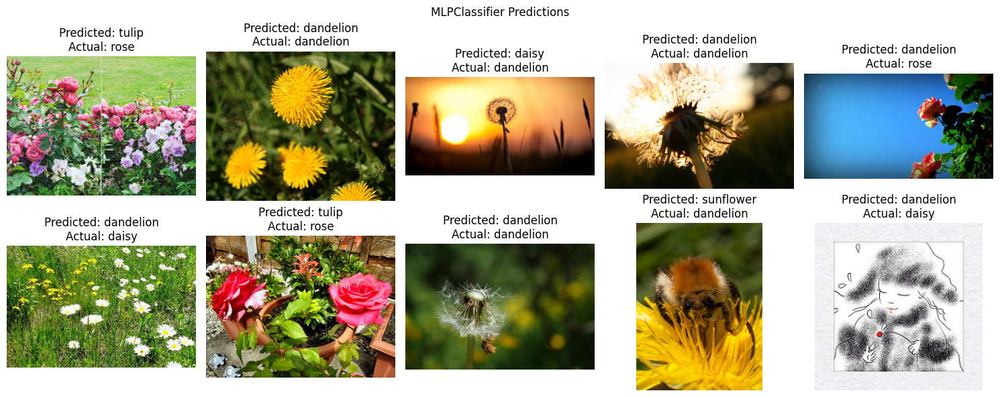

In [ ]:
plot_predictions(mlp_classifier, y_pred_mlp, y_test, X_test, label_encoder.classes_, "MLPClassifier Predictions")

In [ ]:
model_perceptron = Sequential()
model_perceptron.add(Flatten(input_shape=(img_width, img_height, 3)))
model_perceptron.add(Dense(100, activation='relu'))
model_perceptron.add(Dense(len(label_encoder.classes_), activation='softmax'))
model_perceptron.compile(optimizer=Adam(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

/usr/local/lib/python3.10/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [ ]:
from tensorflow import keras

In [ ]:
early_stopping = keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=3, restore_best_weights=True)
history_perceptron = model_perceptron.fit(X_train_processed, y_train, epochs=20, validation_data=(X_test_processed, y_test), callbacks=[early_stopping])
loss, accuracy = model_perceptron.evaluate(X_test_processed, y_test, verbose=0)
#model_perceptron.fit(X_train_processed, y_train, epochs=10, batch_size=32, validation_data=(X_test_processed, y_test))

Epoch 1/20
108/108 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.2848 - loss: 13.2858 - val_accuracy: 0.3588 - val_loss: 1.9992
Epoch 2/20
108/108 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.4364 - loss: 1.5017 - val_accuracy: 0.4410 - val_loss: 1.3741
Epoch 3/20
108/108 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.4612 - loss: 1.4554 - val_accuracy: 0.3426 - val_loss: 2.4600
Epoch 4/20
108/108 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.4613 - loss: 1.6133 - val_accuracy: 0.3762 - val_loss: 1.9466
Epoch 5/20
108/108 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.4744 - loss: 1.4331 - val_accuracy: 0.4282 - val_loss: 1.5593


In [ ]:
from google.colab import files

In [ ]:
model_perceptron.save('modelPerceptron.h5')

# Загрузка файла на Google Диск
upload_file = drive.CreateFile({'title': 'modelPerceptron.h5'})
upload_file.SetContentFile('modelPerceptron.h5')
upload_file.Upload()

Модель: Keras perceptron, Точность: 0.4884


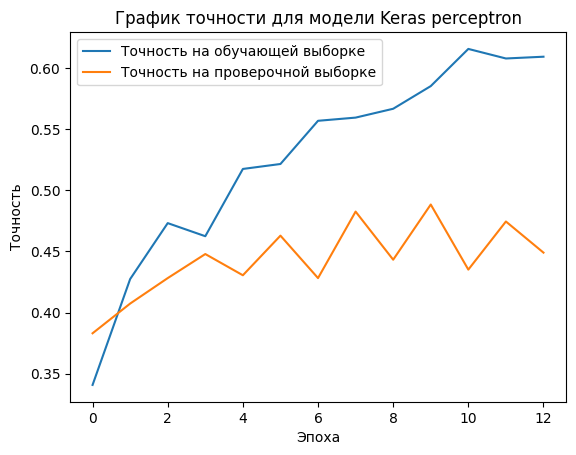

In [ ]:
print(f'Модель: Keras perceptron, Точность: {accuracy:.4f}')
plt.plot(history_perceptron.history['accuracy'], label='Точность на обучающей выборке')
plt.plot(history_perceptron.history['val_accuracy'], label='Точность на проверочной выборке')
plt.xlabel('Эпоха')
plt.ylabel('Точность')
plt.title(f'График точности для модели Keras perceptron')
plt.legend()
plt.show()

Модель: Keras perceptron, Loss: 1.2808


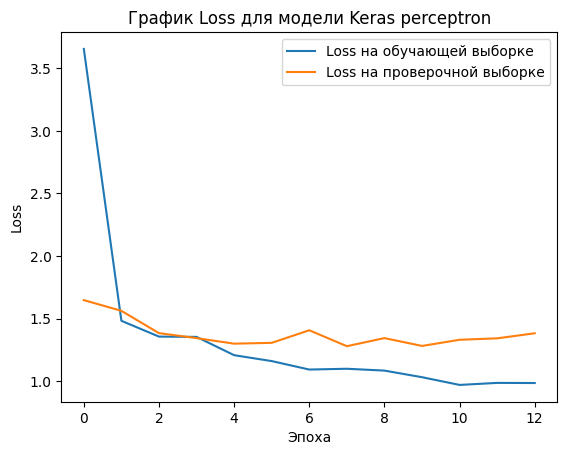

In [ ]:
print(f'Модель: Keras perceptron, Loss: {loss:.4f}')
plt.plot(history_perceptron.history['loss'], label='Loss на обучающей выборке')
plt.plot(history_perceptron.history['val_loss'], label='Loss на проверочной выборке')
plt.xlabel('Эпоха')
plt.ylabel('Loss')
plt.title(f'График Loss для модели Keras perceptron')
plt.legend()
plt.show()

In [ ]:
y_pred_perceptron = np.argmax(model_perceptron.predict(X_test_processed), axis=1)
print("Отчет по классификации персептрона:")
print(classification_report(y_test, y_pred_perceptron))
print("Матрица ошибок персептрона:")
print(confusion_matrix(y_test, y_pred_perceptron))

27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step
Отчет по классификации персептрона:
              precision    recall  f1-score   support

           0       0.46      0.51      0.48       172
           1       0.45      0.45      0.45       203
           2       0.56      0.40      0.46       156
           3       0.45      0.66      0.54       128
           4       0.56      0.47      0.51       205

    accuracy                           0.49       864
   macro avg       0.50      0.50      0.49       864
weighted avg       0.50      0.49      0.49       864

Матрица ошибок персептрона:
[[87 42 12 20 11]
 [63 91  4 37  8]
 [13 24 62 11 46]
 [13 16  3 85 11]
 [15 29 30 34 97]]


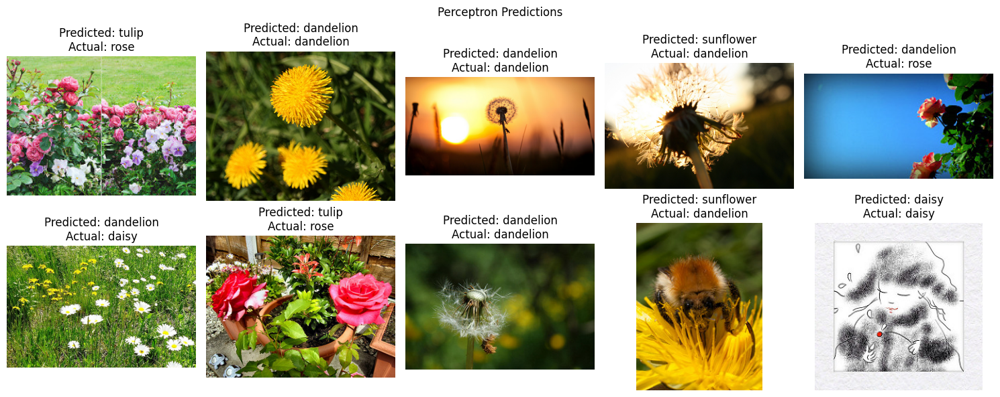

In [ ]:
plot_predictions(model_perceptron, y_pred_perceptron, y_test, X_test, label_encoder.classes_, "Perceptron Predictions")

In [ ]:
from tensorflow.keras.layers import Dropout

In [ ]:
model_perceptron_dif = Sequential()
model_perceptron_dif.add(Flatten(input_shape=(img_width, img_height, 3)))


model_perceptron_dif.add(Dense(256, activation='relu'))


model_perceptron_dif.add(Dense(128, activation='relu'))


model_perceptron_dif.add(Dense(len(label_encoder.classes_), activation='softmax'))
model_perceptron_dif.compile(optimizer=Adam(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

/usr/local/lib/python3.10/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [ ]:
history_perceptron_dif = model_perceptron_dif.fit(X_train_processed, y_train, epochs=20, validation_data=(X_test_processed, y_test))
loss_dif, accuracy_dif = model_perceptron_dif.evaluate(X_test_processed, y_test, verbose=0)

Epoch 1/20
108/108 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - accuracy: 0.2883 - loss: 7.6698 - val_accuracy: 0.3819 - val_loss: 1.6798
Epoch 2/20
108/108 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.4025 - loss: 1.6849 - val_accuracy: 0.3669 - val_loss: 1.6922
Epoch 3/20
108/108 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.4302 - loss: 1.5019 - val_accuracy: 0.3900 - val_loss: 1.4248
Epoch 4/20
108/108 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.4633 - loss: 1.3189 - val_accuracy: 0.4560 - val_loss: 1.2864
Epoch 5/20
108/108 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.5112 - loss: 1.1700 - val_accuracy: 0.3368 - val_loss: 1.9107
Epoch 6/20
108/108 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.5030 - loss: 1.2475 - val_accuracy: 0.4259 - val_loss: 1.2820
Epoch 7/20
108/108 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.5682 - loss: 1.0733 - val_accuracy: 0.4514 - val_loss: 1.3320
Epoch 8/20
108/108 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.5493 - loss: 1.1264 - val_accuracy: 0

In [ ]:
model_perceptron_dif.save('modelPerceptronDiff.h5')

# Загрузка файла на Google Диск
upload_file1 = drive.CreateFile({'title': 'modelPerceptronDiff.h5'})
upload_file1.SetContentFile('modelPerceptronDiff.h5')
upload_file1.Upload()

Модель: Keras perceptron усложненный, Точность: 0.4815


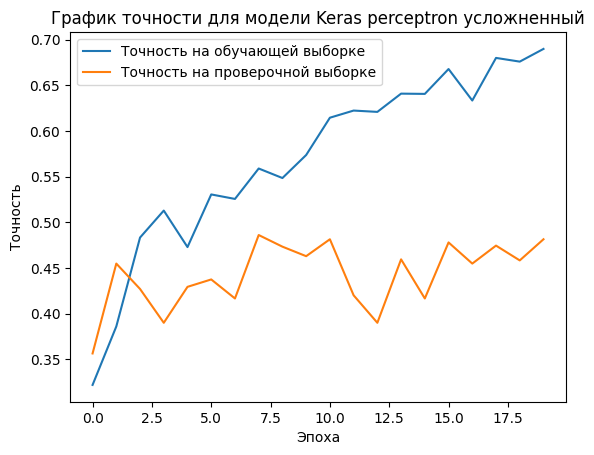

In [ ]:
print(f'Модель: Keras perceptron усложненный, Точность: {accuracy_dif:.4f}')
plt.plot(history_perceptron_dif.history['accuracy'], label='Точность на обучающей выборке')
plt.plot(history_perceptron_dif.history['val_accuracy'], label='Точность на проверочной выборке')
plt.xlabel('Эпоха')
plt.ylabel('Точность')
plt.title(f'График точности для модели Keras perceptron усложненный')
plt.legend()
plt.show()

Модель: Keras perceptron усложненный, Loss: 1.2808


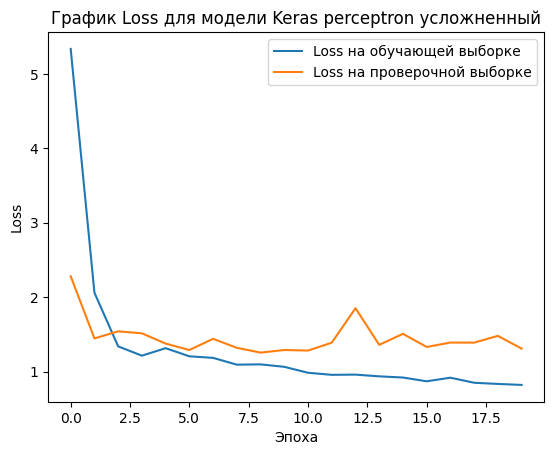

In [ ]:
print(f'Модель: Keras perceptron усложненный, Loss: {loss:.4f}')
plt.plot(history_perceptron_dif.history['loss'], label='Loss на обучающей выборке')
plt.plot(history_perceptron_dif.history['val_loss'], label='Loss на проверочной выборке')
plt.xlabel('Эпоха')
plt.ylabel('Loss')
plt.title(f'График Loss для модели Keras perceptron усложненный')
plt.legend()
plt.show()

In [ ]:
y_pred_perceptron_dif = np.argmax(model_perceptron_dif.predict(X_test_processed), axis=1)
print("Отчет по классификации усложненного персептрона:")
print(classification_report(y_test, y_pred_perceptron_dif))
print("Матрица ошибок усложненного персептрона:")
print(confusion_matrix(y_test, y_pred_perceptron_dif))

27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step
Отчет по классификации усложненного персептрона:
              precision    recall  f1-score   support

           0       0.43      0.51      0.47       172
           1       0.48      0.48      0.48       203
           2       0.52      0.31      0.39       156
           3       0.69      0.45      0.55       128
           4       0.44      0.61      0.51       205

    accuracy                           0.48       864
   macro avg       0.51      0.47      0.48       864
weighted avg       0.50      0.48      0.48       864

Матрица ошибок усложненного персептрона:
[[ 87  37  12   5  31]
 [ 60  97   6  15  25]
 [ 17  19  49   2  69]
 [ 18  16   3  58  33]
 [ 20  32  24   4 125]]


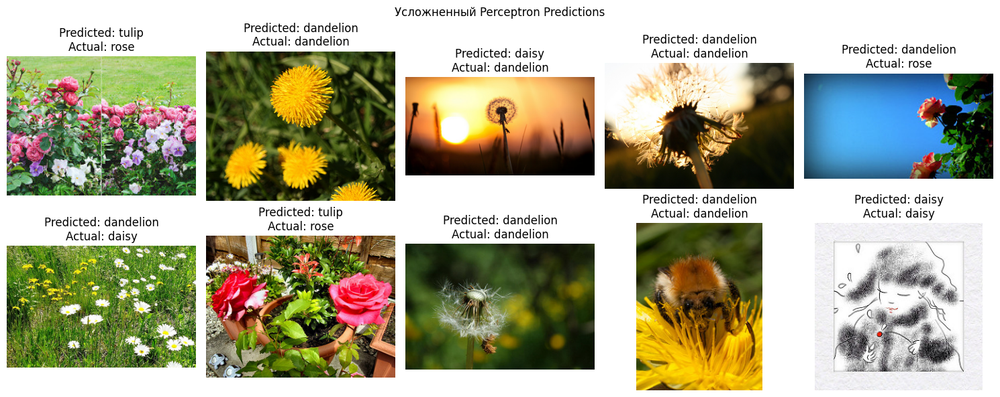

In [ ]:
plot_predictions(model_perceptron_dif, y_pred_perceptron_dif, y_test, X_test, label_encoder.classes_, "Усложненный Perceptron Predictions")

In [ ]:
model_cnn = Sequential()
model_cnn.add(Conv2D(32, (3, 3), activation='relu', input_shape=(img_width, img_height, 3)))
model_cnn.add(MaxPooling2D((2, 2)))
model_cnn.add(Conv2D(64, (3, 3), activation='relu'))
model_cnn.add(MaxPooling2D((2, 2)))
model_cnn.add(Flatten())
model_cnn.add(Dense(100, activation='relu'))
model_cnn.add(Dense(len(label_encoder.classes_), activation='softmax'))
model_cnn.compile(optimizer=Adam(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
early_stopping = keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=3, restore_best_weights=True)
history_cnn = model_cnn.fit(X_train_processed, y_train, epochs=20,batch_size=32, validation_data=(X_test_processed, y_test), callbacks=[early_stopping])
loss_cnn, accuracy_cnn = model_cnn.evaluate(X_test_processed, y_test, verbose=0)


Epoch 1/20
108/108 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step - accuracy: 0.2905 - loss: 2.1258 - val_accuracy: 0.5035 - val_loss: 1.1472
Epoch 2/20
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - accuracy: 0.5691 - loss: 1.1159 - val_accuracy: 0.6157 - val_loss: 0.9852
Epoch 3/20
108/108 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - accuracy: 0.7100 - loss: 0.7884 - val_accuracy: 0.5914 - val_loss: 0.9990
Epoch 4/20
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - accuracy: 0.8393 - loss: 0.4637 - val_accuracy: 0.6088 - val_loss: 1.1183
Epoch 5/20
108/108 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - accuracy: 0.9181 - loss: 0.2538 - val_accuracy: 0.6030 - val_loss: 1.2563


In [ ]:
model_cnn.save('modelCNN.h5')

# Загрузка файла на Google Диск
upload_file2 = drive.CreateFile({'title': 'modelCNN.h5'})
upload_file2.SetContentFile('modelCNN.h5')
upload_file2.Upload()

Модель: Keras CNN, Точность: 0.6586


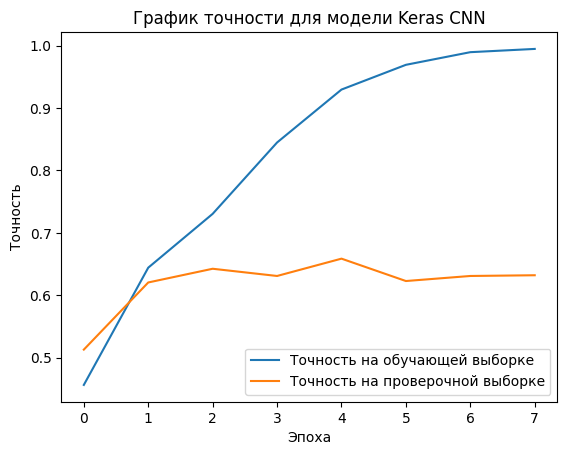

In [ ]:
print(f'Модель: Keras CNN, Точность: {accuracy_cnn:.4f}')
plt.plot(history_cnn.history['accuracy'], label='Точность на обучающей выборке')
plt.plot(history_cnn.history['val_accuracy'], label='Точность на проверочной выборке')
plt.xlabel('Эпоха')
plt.ylabel('Точность')
plt.title(f'График точности для модели Keras CNN')
plt.legend()
plt.show()

Модель: Keras CNN, Loss: 1.0942


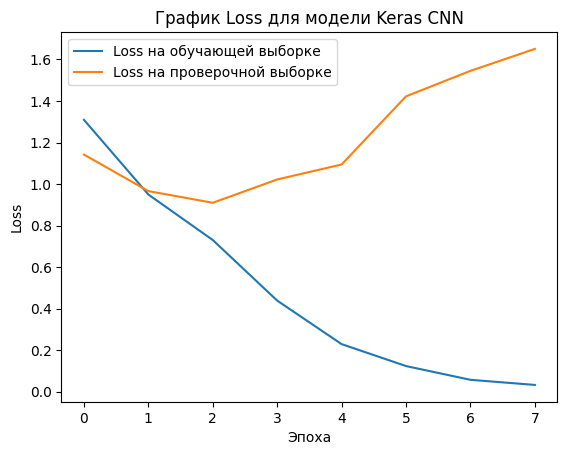

In [ ]:
print(f'Модель: Keras CNN, Loss: {loss_cnn:.4f}')
plt.plot(history_cnn.history['loss'], label='Loss на обучающей выборке')
plt.plot(history_cnn.history['val_loss'], label='Loss на проверочной выборке')
plt.xlabel('Эпоха')
plt.ylabel('Loss')
plt.title(f'График Loss для модели Keras CNN')
plt.legend()
plt.show()

In [ ]:
y_pred_cnn = np.argmax(model_cnn.predict(X_test_processed), axis=1)
print("Отчет по классификации сверточной нейросети:")
print(classification_report(y_test,y_pred_cnn))
print("Матрица ошибок сверточной нейросети:")
print(confusion_matrix(y_test, y_pred_cnn))

27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step
Отчет по классификации сверточной нейросети:
              precision    recall  f1-score   support

           0       0.67      0.67      0.67       172
           1       0.68      0.72      0.70       203
           2       0.59      0.54      0.56       156
           3       0.66      0.77      0.71       128
           4       0.69      0.60      0.64       205

    accuracy                           0.66       864
   macro avg       0.65      0.66      0.66       864
weighted avg       0.66      0.66      0.66       864

Матрица ошибок сверточной нейросети:
[[116  28  15   8   5]
 [ 24 146   9  19   5]
 [ 15  14  84   3  40]
 [  7  10   5  99   7]
 [ 11  18  30  22 124]]


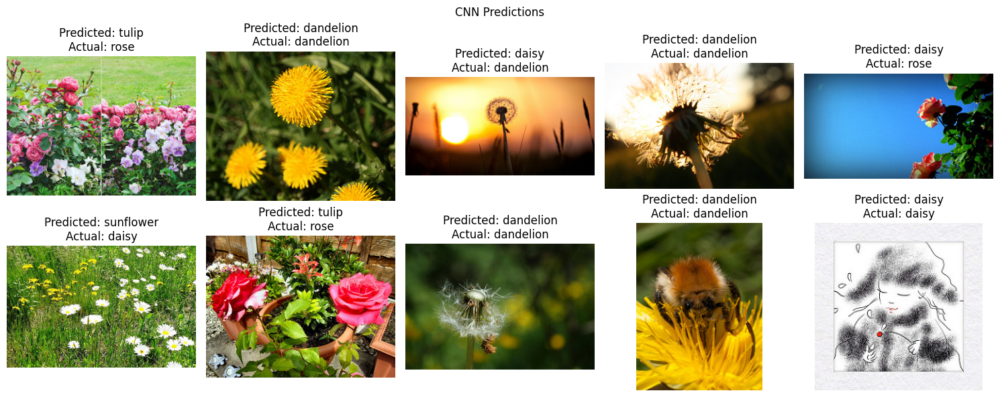

In [ ]:
plot_predictions(model_cnn, y_pred_cnn, y_test, X_test, label_encoder.classes_, "CNN Predictions")

In [ ]:
from tensorflow.keras import layers

In [ ]:
from tensorflow.keras.layers import BatchNormalization

In [ ]:
model_cnn_dif = Sequential()

# Первый сверточный блок
model_cnn_dif.add(Conv2D(32, (3, 3), activation='relu', input_shape=(img_width, img_height, 3)))
model_cnn_dif.add(BatchNormalization())
model_cnn_dif.add(MaxPooling2D((2, 2)))

# Второй сверточный блок
model_cnn_dif.add(Conv2D(64, (3, 3), activation='relu'))
model_cnn_dif.add(BatchNormalization())
model_cnn_dif.add(MaxPooling2D((2, 2)))

# Третий сверточный блок
model_cnn_dif.add(Conv2D(128, (3, 3), activation='relu'))
model_cnn_dif.add(BatchNormalization())
model_cnn_dif.add(MaxPooling2D((2, 2)))


model_cnn_dif.add(Flatten())


model_cnn_dif.add(Dense(256, activation='relu'))
model_cnn_dif.add(BatchNormalization())

model_cnn_dif.add(Dense(128, activation='relu'))
model_cnn_dif.add(BatchNormalization())

model_cnn_dif.add(Dense(len(label_encoder.classes_), activation='softmax'))

model_cnn_dif.compile(optimizer=Adam(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
history_cnn_dif = model_cnn_dif.fit(X_train_processed, y_train, epochs=15,batch_size=32, validation_data=(X_test_processed, y_test))
loss_cnn_dif, accuracy_cnn_dif = model_cnn_dif.evaluate(X_test_processed, y_test, verbose=0)

Epoch 1/15
108/108 ━━━━━━━━━━━━━━━━━━━━ 16s 80ms/step - accuracy: 0.4763 - loss: 1.4891 - val_accuracy: 0.2373 - val_loss: 3.4979
Epoch 2/15
108/108 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - accuracy: 0.6754 - loss: 0.8320 - val_accuracy: 0.2396 - val_loss: 2.9994
Epoch 3/15
108/108 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - accuracy: 0.7855 - loss: 0.6137 - val_accuracy: 0.3646 - val_loss: 1.7908
Epoch 4/15
108/108 ━━━━━━━━━━━━━━━━━━━━ 3s 24ms/step - accuracy: 0.8285 - loss: 0.4729 - val_accuracy: 0.4525 - val_loss: 1.5535
Epoch 5/15
108/108 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - accuracy: 0.9197 - loss: 0.2428 - val_accuracy: 0.5590 - val_loss: 1.4488
Epoch 6/15
108/108 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - accuracy: 0.9381 - loss: 0.1893 - val_accuracy: 0.5741 - val_loss: 1.3151
Epoch 7/15
108/108 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.9645 - loss: 0.1289 - val_accuracy: 0.6377 - val_loss: 1.2891
Epoch 8/15
108/108 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - accuracy: 0.9709 - loss: 0.0936 - val_ac

In [ ]:
model_cnn_dif.save('modelCNNDif.h5')

# Загрузка файла на Google Диск
upload_file3 = drive.CreateFile({'title': 'modelCNNDif.h5'})
upload_file3.SetContentFile('modelCNNDif.h5')
upload_file3.Upload()

Модель: Keras CNN усложненной, Точность: 0.7002


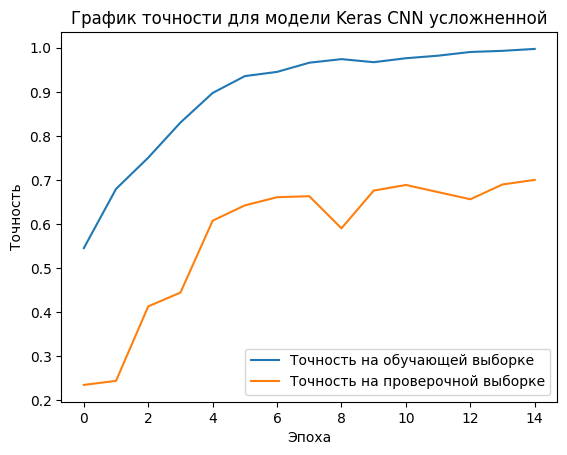

In [ ]:
print(f'Модель: Keras CNN усложненной, Точность: {accuracy_cnn_dif:.4f}')
plt.plot(history_cnn_dif.history['accuracy'], label='Точность на обучающей выборке')
plt.plot(history_cnn_dif.history['val_accuracy'], label='Точность на проверочной выборке')
plt.xlabel('Эпоха')
plt.ylabel('Точность')
plt.title(f'График точности для модели Keras CNN усложненной')
plt.legend()
plt.show()

Модель: Keras CNN усложненная, Loss: 1.2753


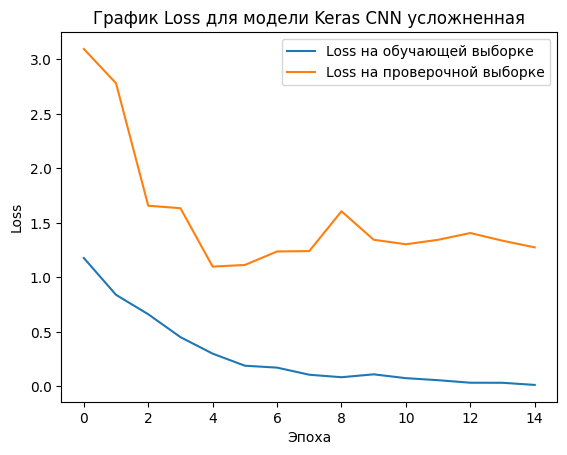

In [ ]:
print(f'Модель: Keras CNN усложненная, Loss: {loss_cnn_dif:.4f}')
plt.plot(history_cnn_dif.history['loss'], label='Loss на обучающей выборке')
plt.plot(history_cnn_dif.history['val_loss'], label='Loss на проверочной выборке')
plt.xlabel('Эпоха')
plt.ylabel('Loss')
plt.title(f'График Loss для модели Keras CNN усложненная')
plt.legend()
plt.show()

In [ ]:
y_pred_cnn_dif = np.argmax(model_cnn_dif.predict(X_test_processed), axis=1)
print("Отчет по классификации сверточной нейросети:")
print(classification_report(y_test,y_pred_cnn_dif))
print("Матрица ошибок сверточной нейросети:")
print(confusion_matrix(y_test, y_pred_cnn_dif))

27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step
Отчет по классификации сверточной нейросети:
              precision    recall  f1-score   support

           0       0.77      0.66      0.71       172
           1       0.67      0.81      0.73       203
           2       0.64      0.58      0.61       156
           3       0.77      0.70      0.73       128
           4       0.70      0.71      0.71       205

    accuracy                           0.70       864
   macro avg       0.71      0.69      0.70       864
weighted avg       0.70      0.70      0.70       864

Матрица ошибок сверточной нейросети:
[[114  24  17   6  11]
 [ 12 165   5  12   9]
 [ 15  15  91   1  34]
 [  3  21   6  89   9]
 [  4  23  24   8 146]]


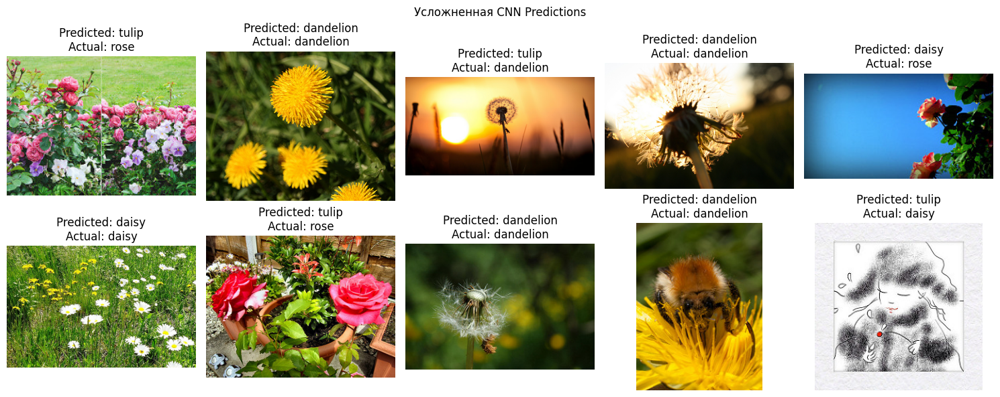

In [ ]:
plot_predictions(model_cnn_dif, y_pred_cnn_dif, y_test, X_test, label_encoder.classes_, "Усложненная CNN Predictions")

In [ ]:
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True
)

In [ ]:
train_generator = train_datagen.flow_from_directory(
    data_dir,
    target_size=(img_width, img_height),
    batch_size=32,
    class_mode='sparse',
    shuffle=True
)

Found 4317 images belonging to 5 classes.


In [ ]:
model_cnn_augmented = Sequential()
model_cnn_augmented.add(Conv2D(32, (3, 3), activation='relu', input_shape=(img_width, img_height, 3)))
model_cnn_augmented.add(MaxPooling2D((2, 2)))
model_cnn_augmented.add(Conv2D(64, (3, 3), activation='relu'))
model_cnn_augmented.add(MaxPooling2D((2, 2)))
model_cnn_augmented.add(Flatten())
model_cnn_augmented.add(Dense(100, activation='relu'))
model_cnn_augmented.add(Dense(len(label_encoder.classes_), activation='softmax'))
model_cnn_augmented.compile(optimizer=Adam(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
history_cnn_aug = model_cnn_augmented.fit(train_generator, epochs=10, validation_data=(X_test_processed, y_test))
loss_cnn_aug, accuracy_cnn_aug = model_cnn_augmented.evaluate(X_test_processed, y_test, verbose=0)

Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


135/135 ━━━━━━━━━━━━━━━━━━━━ 35s 209ms/step - accuracy: 0.3869 - loss: 1.5330 - val_accuracy: 0.5590 - val_loss: 1.0917
Epoch 2/10
135/135 ━━━━━━━━━━━━━━━━━━━━ 31s 169ms/step - accuracy: 0.5628 - loss: 1.0888 - val_accuracy: 0.6181 - val_loss: 0.9439
Epoch 3/10
135/135 ━━━━━━━━━━━━━━━━━━━━ 42s 176ms/step - accuracy: 0.6023 - loss: 0.9882 - val_accuracy: 0.6701 - val_loss: 0.8427
Epoch 4/10
135/135 ━━━━━━━━━━━━━━━━━━━━ 25s 175ms/step - accuracy: 0.6321 - loss: 0.9110 - val_accuracy: 0.6806 - val_loss: 0.8541
Epoch 5/10
135/135 ━━━━━━━━━━━━━━━━━━━━ 41s 173ms/step - accuracy: 0.6506 - loss: 0.8919 - val_accuracy: 0.6933 - val_loss: 0.7930
Epoch 6/10
135/135 ━━━━━━━━━━━━━━━━━━━━ 25s 174ms/step - accuracy: 0.6608 - loss: 0.8734 - val_accuracy: 0.7002 - val_loss: 0.7412
Epoch 7/10
135/135 ━━━━━━━━━━━━━━━━━━━━ 41s 171ms/step - accuracy: 0.6777 - loss: 0.8425 - val_accuracy: 0.7176 - val_loss: 0.7479
Epoch 8/10
135/135 ━━━━━━━━━━━━━━━━━━━━ 24s 173ms/step - accuracy: 0.7007 - loss: 0.7997 - val

In [ ]:
model_cnn_augmented.save('modelCNNAug.h5')

# Загрузка файла на Google Диск
upload_file4 = drive.CreateFile({'title': 'modelCNNAug.h5'})
upload_file4.SetContentFile('modelCNNAug.h5')
upload_file4.Upload()

Модель: Keras CNN с аугментацией, Точность: 0.7535


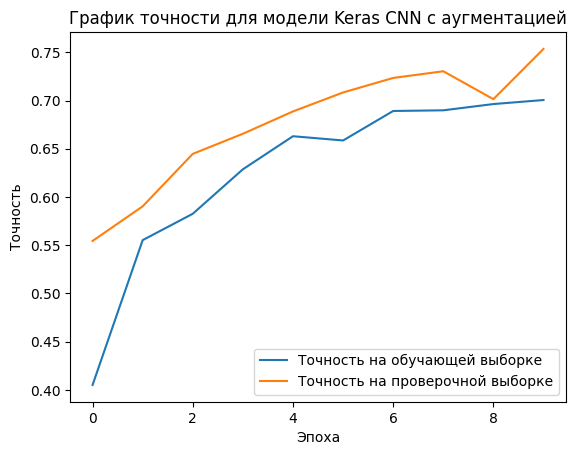

In [ ]:
print(f'Модель: Keras CNN с аугментацией, Точность: {accuracy_cnn_aug:.4f}')
plt.plot(history_cnn_aug.history['accuracy'], label='Точность на обучающей выборке')
plt.plot(history_cnn_aug.history['val_accuracy'], label='Точность на проверочной выборке')
plt.xlabel('Эпоха')
plt.ylabel('Точность')
plt.title(f'График точности для модели Keras CNN с аугментацией')
plt.legend()
plt.show()

Модель: Keras CNN с аугментацией, Loss: 0.6511


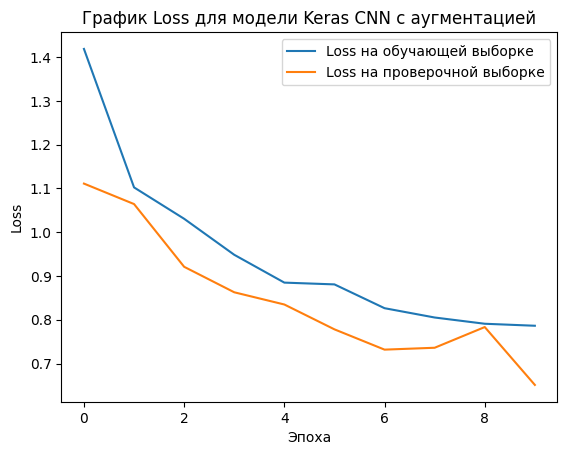

In [ ]:
print(f'Модель: Keras CNN с аугментацией, Loss: {loss_cnn_aug:.4f}')
plt.plot(history_cnn_aug.history['loss'], label='Loss на обучающей выборке')
plt.plot(history_cnn_aug.history['val_loss'], label='Loss на проверочной выборке')
plt.xlabel('Эпоха')
plt.ylabel('Loss')
plt.title(f'График Loss для модели Keras CNN с аугментацией')
plt.legend()
plt.show()

In [ ]:
y_pred_cnn_augmented = np.argmax(model_cnn_augmented.predict(X_test_processed), axis=1)
print("Отчет по классификации сверточной нейросети с аугментацией:")
print(classification_report(y_test, y_pred_cnn_augmented))
print("Матрица ошибок сверточной нейросети с аугментацией:")
print(confusion_matrix(y_test, y_pred_cnn_augmented))

27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step
Отчет по классификации сверточной нейросети с аугментацией:
              precision    recall  f1-score   support

           0       0.91      0.68      0.78       151
           1       0.75      0.85      0.80       224
           2       0.66      0.63      0.65       138
           3       0.77      0.84      0.81       152
           4       0.71      0.72      0.72       199

    accuracy                           0.75       864
   macro avg       0.76      0.74      0.75       864
weighted avg       0.76      0.75      0.75       864

Матрица ошибок сверточной нейросети с аугментацией:
[[102  28   8   7   6]
 [  2 191   6  16   9]
 [  3   9  87   4  35]
 [  2  13   2 128   7]
 [  3  14  28  11 143]]


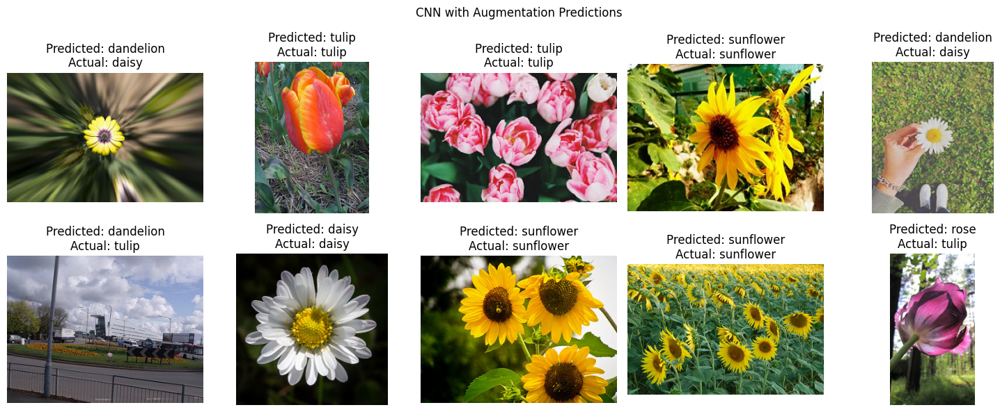

In [ ]:
plot_predictions(model_cnn_augmented, y_pred_cnn_augmented, y_test, X_test, label_encoder.classes_, "CNN with Augmentation Predictions")

In [ ]:
history_cnn_aug = model_cnn_augmented.fit(train_generator, epochs=10, validation_data=(X_test_processed, y_test))
loss_cnn_aug, accuracy_cnn_aug = model_cnn_augmented.evaluate(X_test_processed, y_test, verbose=0)

Epoch 1/10
135/135 ━━━━━━━━━━━━━━━━━━━━ 28s 200ms/step - accuracy: 0.7200 - loss: 0.7307 - val_accuracy: 0.7454 - val_loss: 0.6997
Epoch 2/10
135/135 ━━━━━━━━━━━━━━━━━━━━ 38s 170ms/step - accuracy: 0.7050 - loss: 0.7521 - val_accuracy: 0.7373 - val_loss: 0.7534
Epoch 3/10
135/135 ━━━━━━━━━━━━━━━━━━━━ 42s 186ms/step - accuracy: 0.7192 - loss: 0.7229 - val_accuracy: 0.7720 - val_loss: 0.6410
Epoch 4/10
135/135 ━━━━━━━━━━━━━━━━━━━━ 28s 197ms/step - accuracy: 0.7324 - loss: 0.6955 - val_accuracy: 0.7558 - val_loss: 0.6382
Epoch 5/10
135/135 ━━━━━━━━━━━━━━━━━━━━ 51s 271ms/step - accuracy: 0.7373 - loss: 0.6988 - val_accuracy: 0.7847 - val_loss: 0.5862
Epoch 6/10
135/135 ━━━━━━━━━━━━━━━━━━━━ 43s 283ms/step - accuracy: 0.7520 - loss: 0.6657 - val_accuracy: 0.7674 - val_loss: 0.5845
Epoch 7/10
135/135 ━━━━━━━━━━━━━━━━━━━━ 28s 199ms/step - accuracy: 0.7577 - loss: 0.6475 - val_accuracy: 0.7870 - val_loss: 0.5875
Epoch 8/10
135/135 ━━━━━━━━━━━━━━━━━━━━ 35s 242ms/step - accuracy: 0.7513 - loss: 0

Модель: Keras CNN с аугментацией, Точность: 0.8090


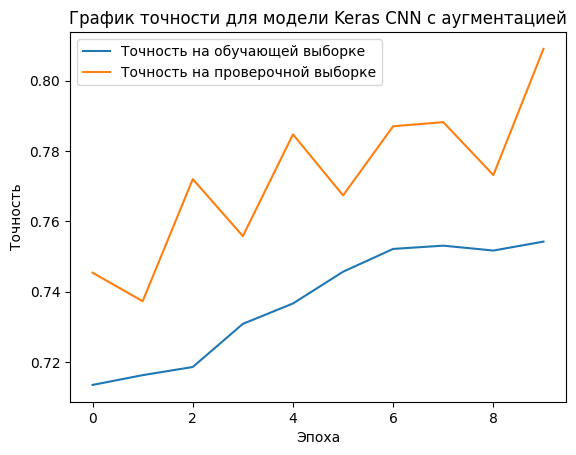

In [ ]:
print(f'Модель: Keras CNN с аугментацией, Точность: {accuracy_cnn_aug:.4f}')
plt.plot(history_cnn_aug.history['accuracy'], label='Точность на обучающей выборке')
plt.plot(history_cnn_aug.history['val_accuracy'], label='Точность на проверочной выборке')
plt.xlabel('Эпоха')
plt.ylabel('Точность')
plt.title(f'График точности для модели Keras CNN с аугментацией')
plt.legend()
plt.show()

Модель: Keras CNN с аугментацией, Loss: 0.5052


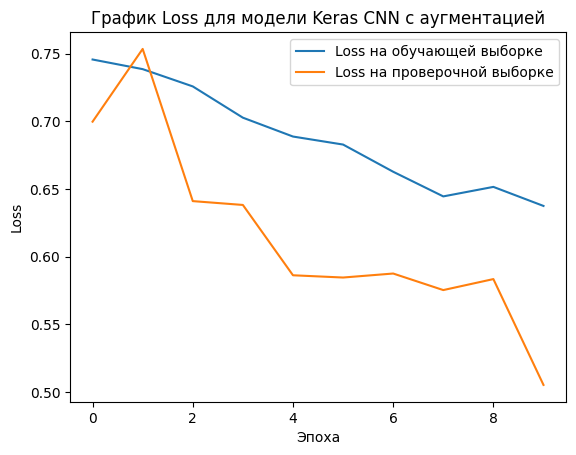

In [ ]:
print(f'Модель: Keras CNN с аугментацией, Loss: {loss_cnn_aug:.4f}')
plt.plot(history_cnn_aug.history['loss'], label='Loss на обучающей выборке')
plt.plot(history_cnn_aug.history['val_loss'], label='Loss на проверочной выборке')
plt.xlabel('Эпоха')
plt.ylabel('Loss')
plt.title(f'График Loss для модели Keras CNN с аугментацией')
plt.legend()
plt.show()

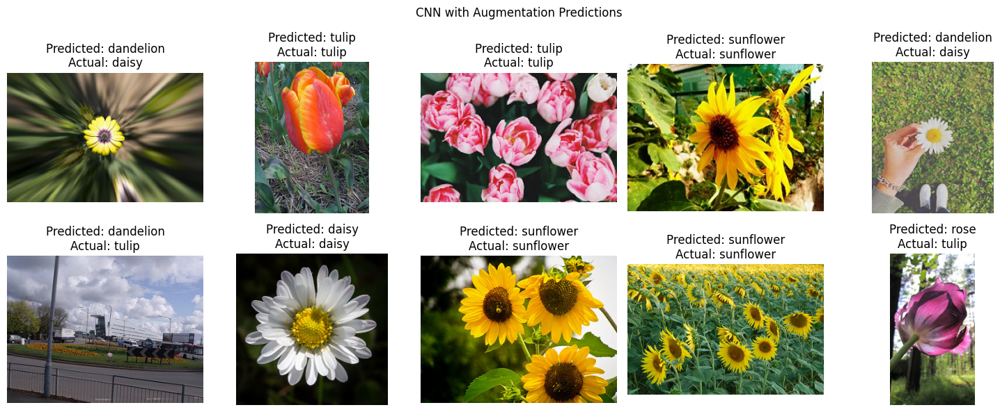

In [ ]:
plot_predictions(model_cnn_augmented, y_pred_cnn_augmented, y_test, X_test, label_encoder.classes_, "CNN with Augmentation Predictions")

In [ ]:
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(img_width, img_height, 3))
x = base_model.output
x = Flatten()(x)
x = Dense(100, activation='relu')(x)
predictions = Dense(len(label_encoder.classes_), activation='softmax')(x)

model_vgg16 = Model(inputs=base_model.input, outputs=predictions)
for layer in base_model.layers:
    layer.trainable = False

model_vgg16.compile(optimizer=Adam(learning_rate=0.001), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [ ]:
history_vgg = model_vgg16.fit(X_train_processed, y_train, epochs=10, batch_size=32, validation_data=(X_test_processed, y_test))
loss_vgg, accuracy_vgg = model_vgg16.evaluate(X_test_processed, y_test, verbose=0)

Epoch 1/10
108/108 ━━━━━━━━━━━━━━━━━━━━ 28s 175ms/step - accuracy: 0.5578 - loss: 1.1370 - val_accuracy: 0.7222 - val_loss: 0.7600
Epoch 2/10
108/108 ━━━━━━━━━━━━━━━━━━━━ 20s 57ms/step - accuracy: 0.8280 - loss: 0.4988 - val_accuracy: 0.7928 - val_loss: 0.5693
Epoch 3/10
108/108 ━━━━━━━━━━━━━━━━━━━━ 10s 51ms/step - accuracy: 0.8884 - loss: 0.3289 - val_accuracy: 0.7731 - val_loss: 0.6568
Epoch 4/10
108/108 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9353 - loss: 0.2172 - val_accuracy: 0.7755 - val_loss: 0.6398
Epoch 5/10
108/108 ━━━━━━━━━━━━━━━━━━━━ 5s 51ms/step - accuracy: 0.9559 - loss: 0.1528 - val_accuracy: 0.7986 - val_loss: 0.6566
Epoch 6/10
108/108 ━━━━━━━━━━━━━━━━━━━━ 7s 63ms/step - accuracy: 0.9655 - loss: 0.1221 - val_accuracy: 0.8044 - val_loss: 0.6699
Epoch 7/10
108/108 ━━━━━━━━━━━━━━━━━━━━ 6s 51ms/step - accuracy: 0.9911 - loss: 0.0640 - val_accuracy: 0.8021 - val_loss: 0.6982
Epoch 8/10
108/108 ━━━━━━━━━━━━━━━━━━━━ 6s 51ms/step - accuracy: 0.9968 - loss: 0.0408 - val_

In [ ]:
model_vgg16.save('modelVGG16.h5')

# Загрузка файла на Google Диск
upload_file5 = drive.CreateFile({'title': 'modelVGG16.h5'})
upload_file5.SetContentFile('modelVGG16.h5')
upload_file5.Upload()

Модель: VGG16, Точность: 0.7894


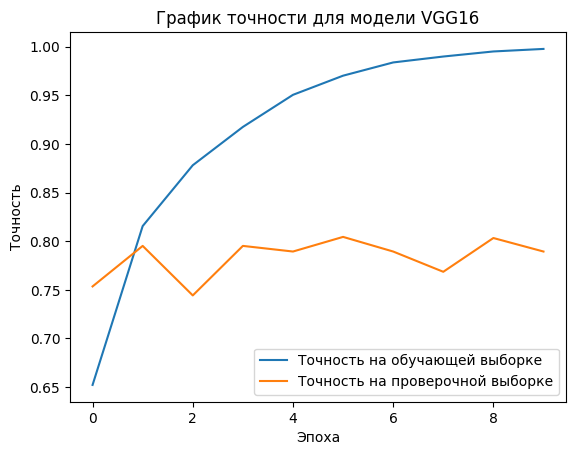

In [ ]:
print(f'Модель: VGG16, Точность: {accuracy_vgg:.4f}')
plt.plot(history_vgg.history['accuracy'], label='Точность на обучающей выборке')
plt.plot(history_vgg.history['val_accuracy'], label='Точность на проверочной выборке')
plt.xlabel('Эпоха')
plt.ylabel('Точность')
plt.title(f'График точности для модели VGG16')
plt.legend()
plt.show()

Модель: VGG16, Loss: 0.7536


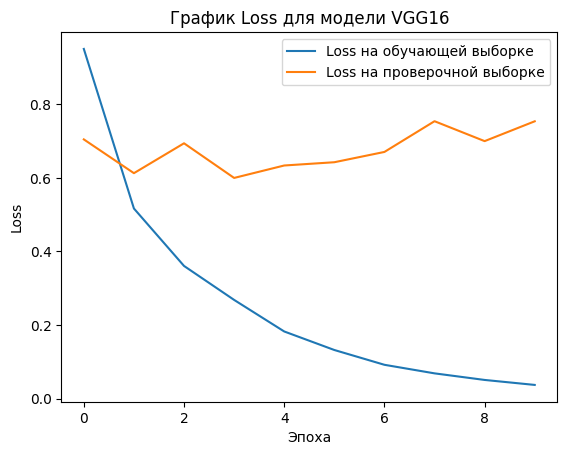

In [ ]:
print(f'Модель: VGG16, Loss: {loss_vgg:.4f}')
plt.plot(history_vgg.history['loss'], label='Loss на обучающей выборке')
plt.plot(history_vgg.history['val_loss'], label='Loss на проверочной выборке')
plt.xlabel('Эпоха')
plt.ylabel('Loss')
plt.title(f'График Loss для модели VGG16')
plt.legend()
plt.show()

In [ ]:
y_pred_vgg16 = np.argmax(model_vgg16.predict(X_test_processed), axis=1)
print("Отчет по классификации VGG16:")
print(classification_report(y_test, y_pred_vgg16))
print("Матрица ошибок VGG16:")
print(confusion_matrix(y_test, y_pred_vgg16))

27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step
Отчет по классификации VGG16:
              precision    recall  f1-score   support

           0       0.78      0.79      0.79       151
           1       0.89      0.83      0.85       224
           2       0.77      0.65      0.71       138
           3       0.82      0.77      0.80       152
           4       0.70      0.85      0.77       199

    accuracy                           0.79       864
   macro avg       0.79      0.78      0.78       864
weighted avg       0.80      0.79      0.79       864

Матрица ошибок VGG16:
[[120  10   2   5  14]
 [ 15 185   5   8  11]
 [  9   4  90   5  30]
 [  5   6   7 117  17]
 [  5   4  13   7 170]]


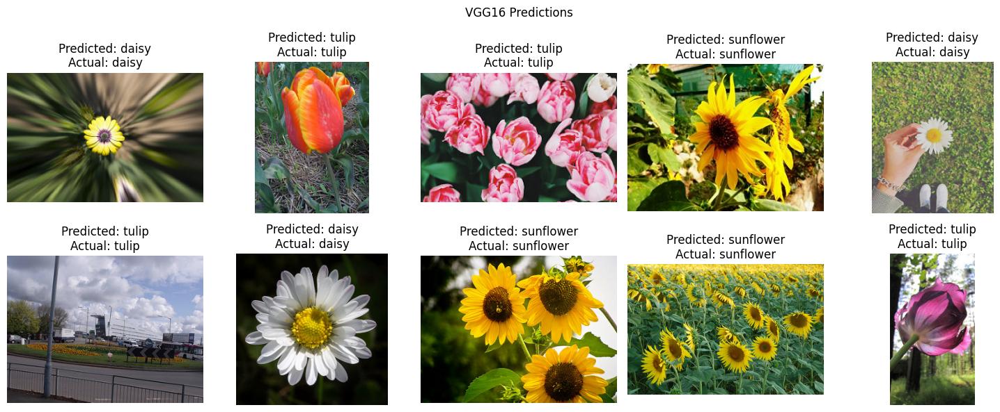

In [ ]:
plot_predictions(model_vgg16, y_pred_vgg16, y_test, X_test, label_encoder.classes_, "VGG16 Predictions")